In [1]:
# import all
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from patchify import patchify, unpatchify
%matplotlib inline
from skimage.filters import threshold_otsu
from skimage.morphology import skeletonize
import networkx as nx
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

In [2]:
def f1(y_true, y_pred):
    def recall_m(y_true, y_pred):
        TP = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        Positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = TP / (Positives+K.epsilon())
        return recall
    
    def precision_m(y_true, y_pred):
        TP = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        Pred_Positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = TP / (Pred_Positives+K.epsilon())
        return precision
    
    precision, recall = precision_m(y_true, y_pred), recall_m(y_true, y_pred)
    
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [3]:
# Load the model you trained in task5_training.ipynb
from tensorflow.keras.models import load_model
patch_size = 256
example_file_name = "/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task5/03_task5/rayanedaborisova_220471_unet_model_256px 1.h5"
model = load_model(example_file_name, custom_objects={"f1": f1})

2025-08-14 16:15:45.410595: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-14 16:16:10.474743: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
def crop(img):
    original_shape = img.shape

    # Convert to grayscale if RGB
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Blur and threshold to detect contours
    blurred = cv2.GaussianBlur(img, (11, 11), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return img, {
            "original_shape": original_shape,
            "legend_cropped": False,
            "used_crop": False
        }

    # Crop around largest contour (Petri dish)
    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)
    size = max(w, h)
    x_center, y_center = x + w // 2, y + h // 2
    x_start = max(0, x_center - size // 2)
    y_start = max(0, y_center - size // 2)

    cropped = img[y_start:y_start + size, x_start:x_start + size]

    crop_info = {
        "original_shape": original_shape,
        "legend_cropped": False,
        "used_crop": True,
        "x_start": x_start,
        "y_start": y_start,
        "crop_size": size
    }

    return cropped, crop_info

In [5]:
def pad(img, patch_size):
    h, w = img.shape[:2]

    height_margin = ((h // patch_size) + 1) * patch_size - h
    width_margin = ((w // patch_size) + 1) * patch_size - w

    top_margin = int(height_margin / 2)
    bottom_margin = height_margin - top_margin
    left_margin = int(width_margin / 2)
    right_margin = width_margin - left_margin

    padded_img = cv2.copyMakeBorder(
        img,
        top_margin, bottom_margin,
        left_margin, right_margin,
        cv2.BORDER_CONSTANT, value=0
    )

    return padded_img, (top_margin, bottom_margin, left_margin, right_margin)

In [9]:
def uncrop(cropped_img, crop_info):
    original_shape = crop_info["original_shape"]
    canvas = np.zeros(original_shape[:2], dtype=cropped_img.dtype)

    if not crop_info.get("used_crop", False):
        return cropped_img

    x_start = crop_info["x_start"]
    y_start = crop_info["y_start"]
    size = crop_info["crop_size"]

    # Paste cropped prediction back into full-sized black canvas
    canvas[y_start:y_start + size, x_start:x_start + size] = cropped_img

    # Legend logic removed (didn't work on .tif), so nothing is padded back
    return canvas

In [10]:
def unpad(img, padding):
    top, bottom, left, right = padding
    return img[top:img.shape[0]-bottom, left:img.shape[1]-right]

In [11]:
def predict_masks(folder_path, model, patch_size=256):
    results = {}

    for filename in sorted(os.listdir(folder_path)):
        if not filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff')):
            continue

        print(f"\nProcessing {filename}")
        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path, 0)

        h, w = image.shape
        print(f"Original image shape: {h} x {w}")

        # Preprocessing
        petri_dish, crop_info = crop(image)
        print(f"Petri dish image shape: {petri_dish.shape}")

        petri_dish_padded, pad_info = pad(petri_dish, patch_size)
        print(f"Padded image shape: {petri_dish_padded.shape}")

        # Patchify and predict
        patches = patchify(petri_dish_padded, (patch_size, patch_size), step=128)
        patches_shape = patches.shape
        patches_reshaped = patches.reshape(-1, patch_size, patch_size, 1) / 255.0

        predictions = model.predict(patches_reshaped, verbose=1)
        predictions = predictions.squeeze().reshape(patches_shape[0], patches_shape[1], patch_size, patch_size)

        predicted_mask = unpatchify(predictions, petri_dish_padded.shape)
        print("Predicted mask shape:", predicted_mask.shape)
        
        # Restore to original size
        predicted_mask_unpadded = unpad(predicted_mask, pad_info)
        predicted_mask_corrected = uncrop(predicted_mask_unpadded, crop_info)
        print("Predicted mask corrected shape:", predicted_mask_corrected.shape)

        # Store everything (metadata silently)
        results[filename] = {
            'mask': predicted_mask_corrected,
            'crop_info': crop_info,
            'pad_info': pad_info
        }

        # Show visual output only
        f, ax = plt.subplots(1, 3, dpi=250, figsize=(15, 5))

        ax[0].imshow(image, cmap='gray')
        ax[0].set_title(f"{filename} — Original")
        ax[0].axis('off')

        ax[1].imshow(predicted_mask, cmap='gray')
        ax[1].set_title("Raw Model Output")
        ax[1].axis('off')

        ax[2].imshow(image, cmap='gray')
        ax[2].imshow(predicted_mask_corrected, cmap='Reds', alpha=(predicted_mask_corrected > 0.1) * 0.6)
        ax[2].set_title("Overlay: Prediction")
        ax[2].axis('off')

        plt.tight_layout()
        plt.show()

    return results


Processing test_image_1.png


Original image shape: 3006 x 4112
Petri dish image shape: (2742, 2742)
Padded image shape: (2816, 2816)
14/14 [==============================] - 280s 21s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4112)


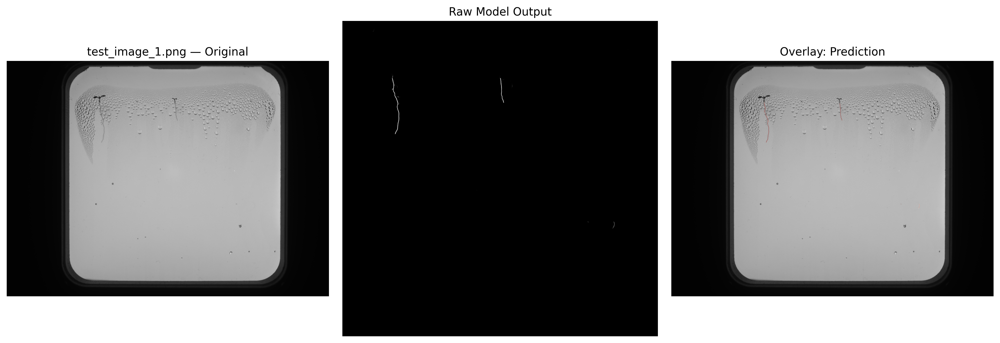


Processing test_image_10.png
Original image shape: 3006 x 4202
Petri dish image shape: (2774, 2774)
Padded image shape: (2816, 2816)
14/14 [==============================] - 326s 22s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


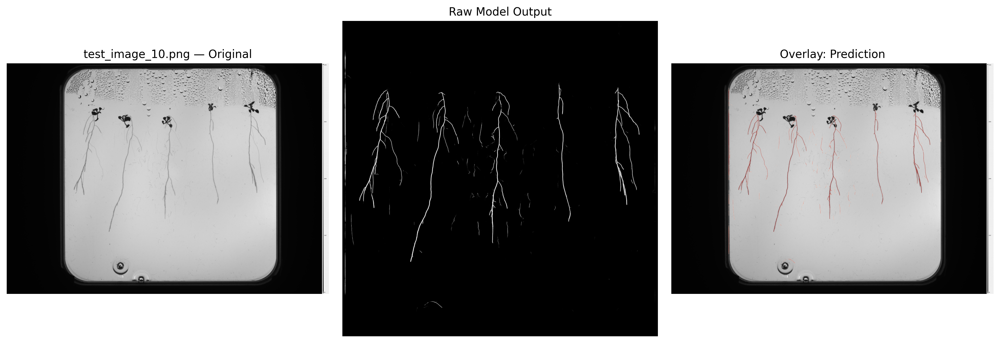


Processing test_image_11.png
Original image shape: 3006 x 4202
Petri dish image shape: (2774, 2774)
Padded image shape: (2816, 2816)
14/14 [==============================] - 194s 14s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


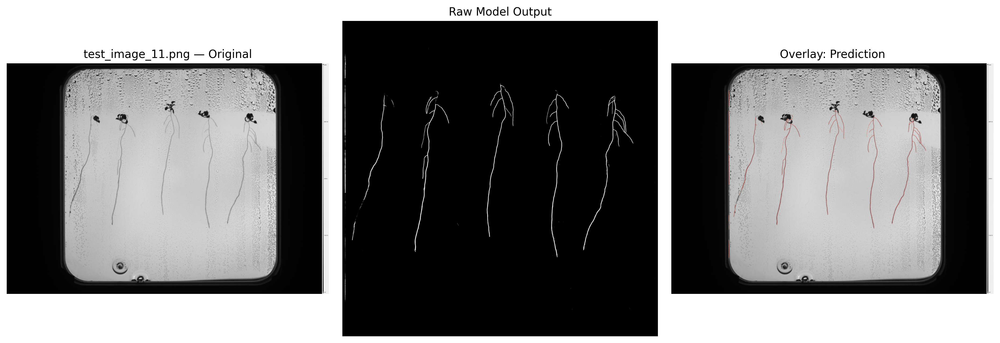


Processing test_image_2.png
Original image shape: 3006 x 4202
Petri dish image shape: (2742, 2742)
Padded image shape: (2816, 2816)
14/14 [==============================] - 367s 27s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


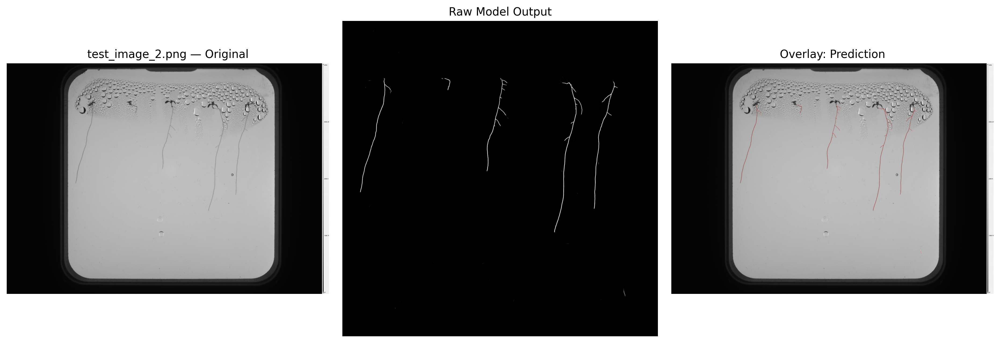


Processing test_image_3.png
Original image shape: 3006 x 4202
Petri dish image shape: (2742, 2742)
Padded image shape: (2816, 2816)
14/14 [==============================] - 294s 21s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


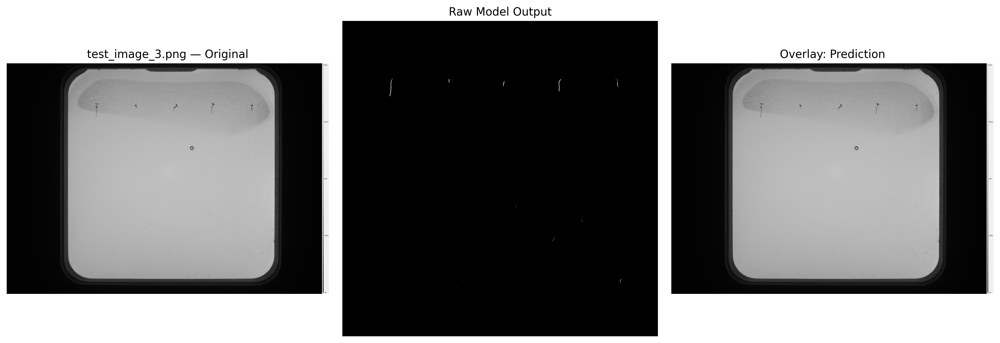


Processing test_image_4.png
Original image shape: 3006 x 4202
Petri dish image shape: (2742, 2742)
Padded image shape: (2816, 2816)
14/14 [==============================] - 218s 15s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


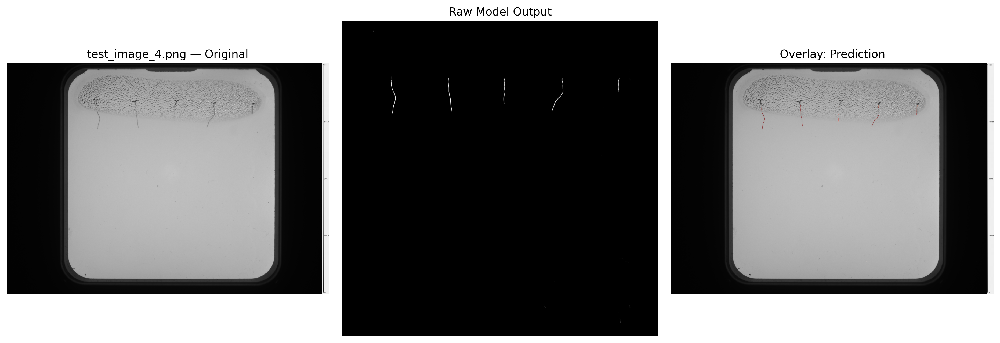


Processing test_image_5.png
Original image shape: 3006 x 4202
Petri dish image shape: (2742, 2742)
Padded image shape: (2816, 2816)
14/14 [==============================] - 170s 12s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


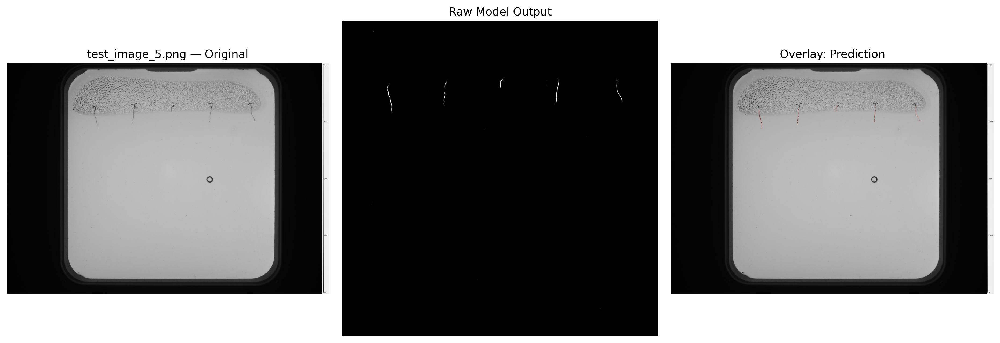


Processing test_image_6.png
Original image shape: 3006 x 4202
Petri dish image shape: (2742, 2742)
Padded image shape: (2816, 2816)
14/14 [==============================] - 193s 13s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


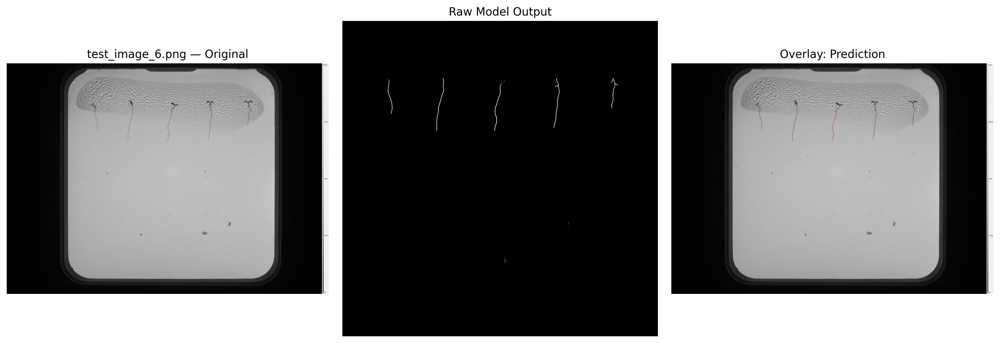


Processing test_image_7.png
Original image shape: 3006 x 4202
Petri dish image shape: (2742, 2742)
Padded image shape: (2816, 2816)
14/14 [==============================] - 110s 8s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


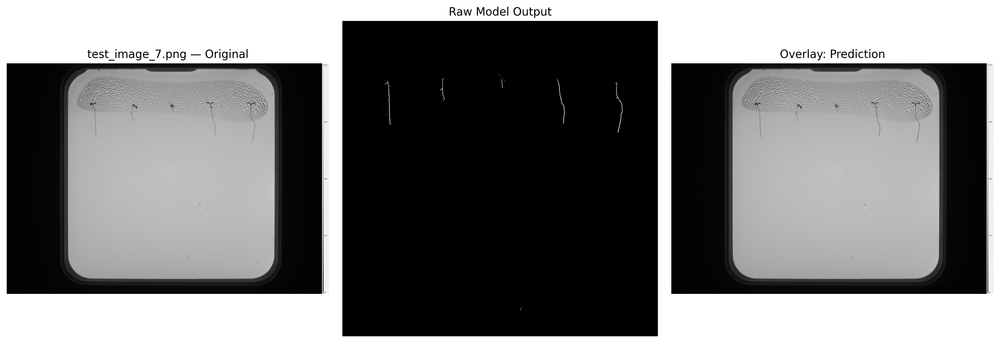


Processing test_image_8.png
Original image shape: 3006 x 4202
Petri dish image shape: (2743, 2743)
Padded image shape: (2816, 2816)
14/14 [==============================] - 177s 13s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


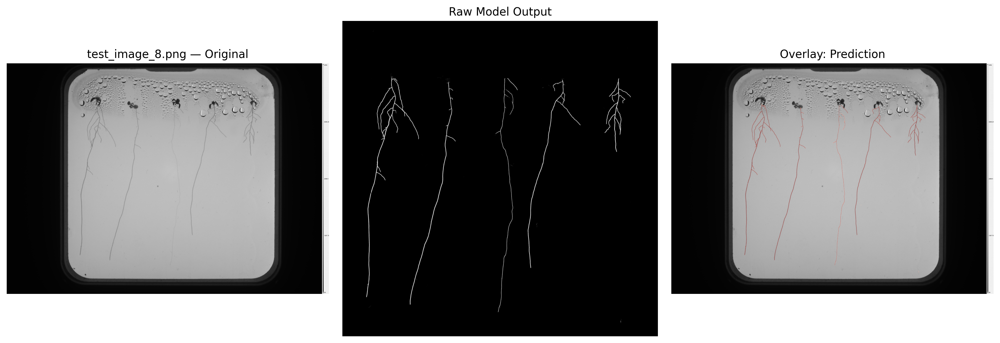


Processing test_image_9.png
Original image shape: 3006 x 4202
Petri dish image shape: (2774, 2774)
Padded image shape: (2816, 2816)
14/14 [==============================] - 207s 15s/step
Predicted mask shape: (2816, 2816)
Predicted mask corrected shape: (3006, 4202)


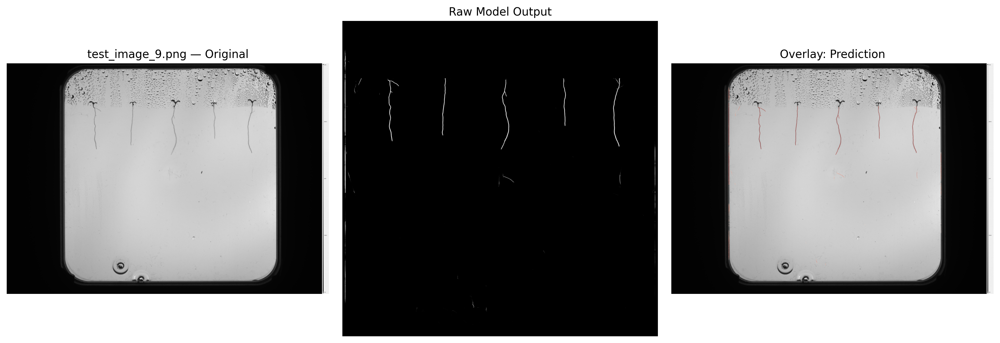

In [12]:
# Apply the predict_masks_raw() function to get the masks
raw_predictions = predict_masks(
    "/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/Kaggle", 
    model
)

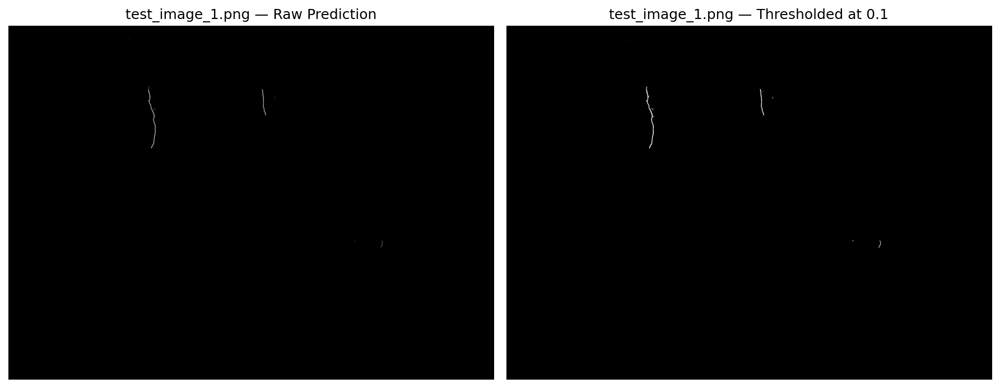

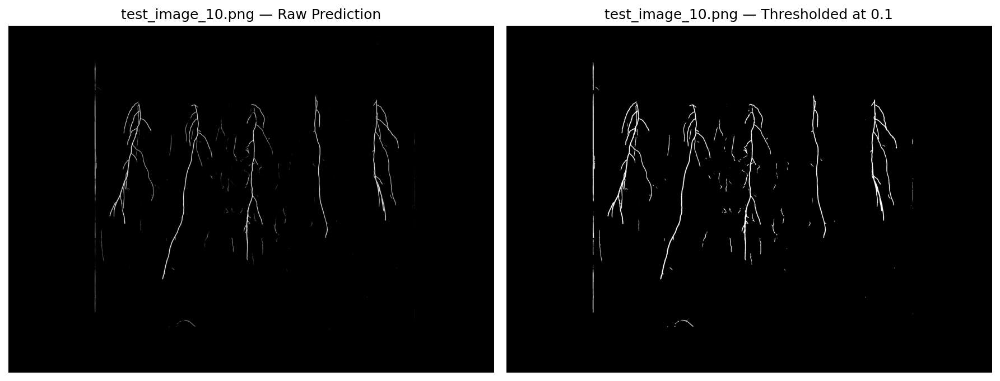

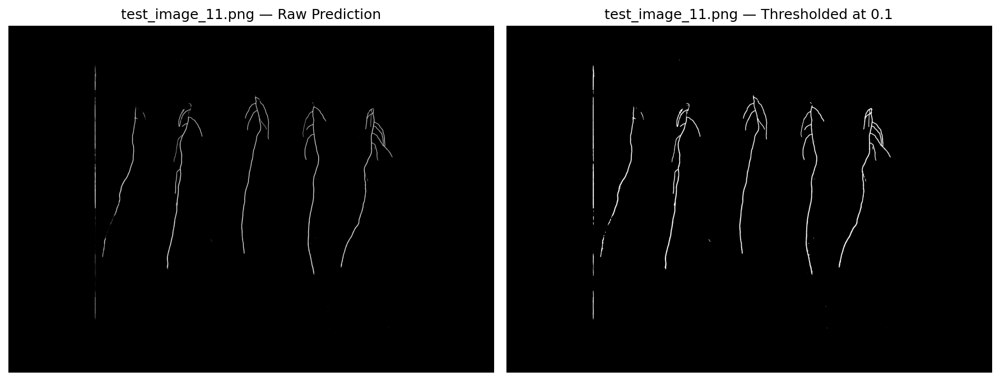

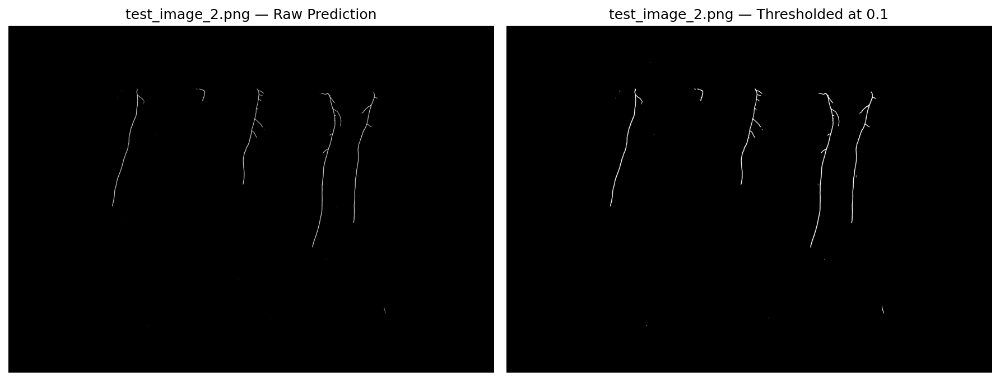

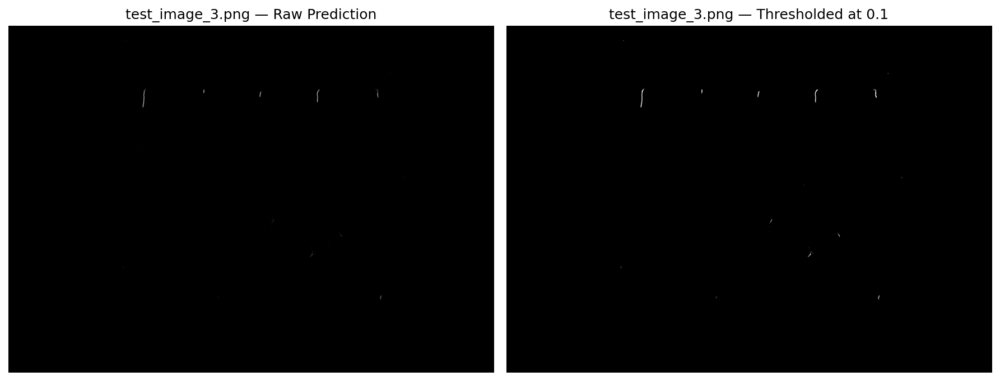

...

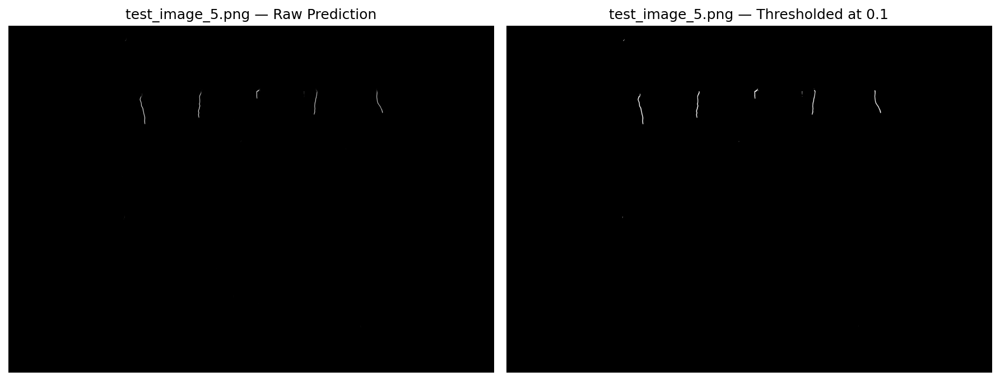

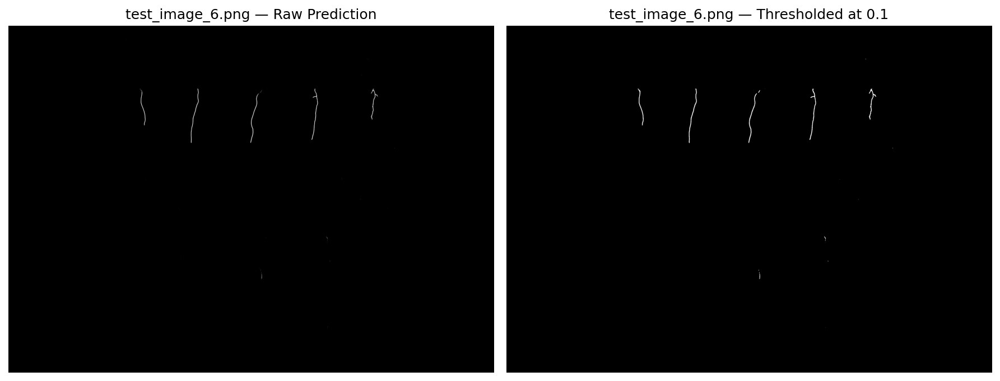

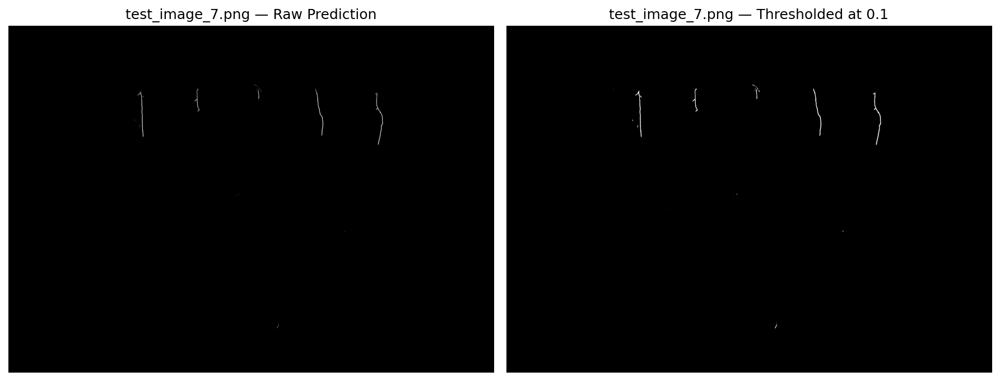

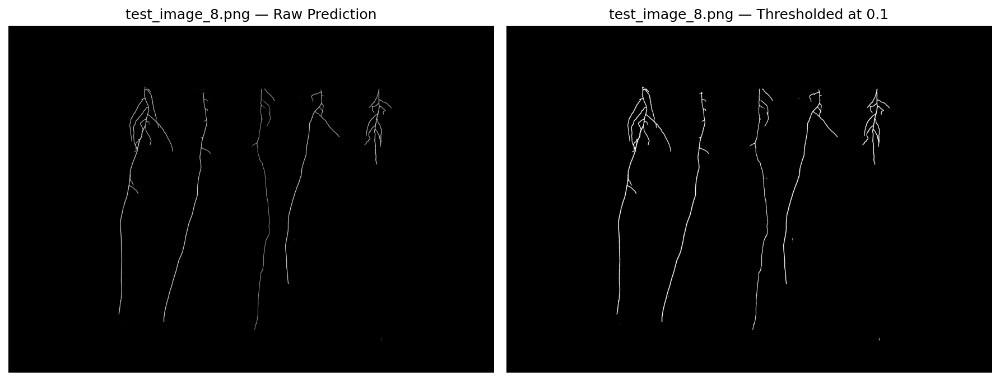

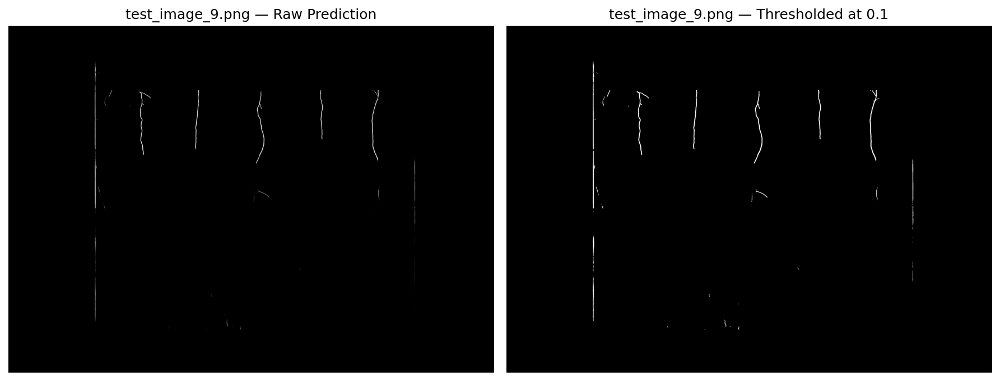

In [13]:
# Binarizing the masks with an appropriate threshold
thresholded_masks = {}

# SETTINGS — Choose either global or adaptive thresholding
use_percentile = False         # Set to True to enable adaptive thresholding
global_threshold = 0.1

for name, raw in raw_predictions.items():
    mask = raw['mask']

    # Determine threshold
    if use_percentile:
        p = np.percentile(mask, 85)  # 85th percentile threshold (adjust as needed)
        binary = (mask > p).astype(np.uint8)
        threshold_used = round(p, 3)
    else:
        binary = (mask > global_threshold).astype(np.uint8)
        threshold_used = global_threshold

    thresholded_masks[name] = binary

    # Display side-by-side visualization
    plt.figure(figsize=(12, 5), dpi=150)
    plt.subplot(1, 2, 1)
    plt.imshow(mask, cmap='gray')
    plt.title(f'{name} — Raw Prediction')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(binary * 255, cmap='gray')
    plt.title(f'{name} — Thresholded at {threshold_used}')
    plt.axis('off')
    plt.tight_layout()
    plt.show()


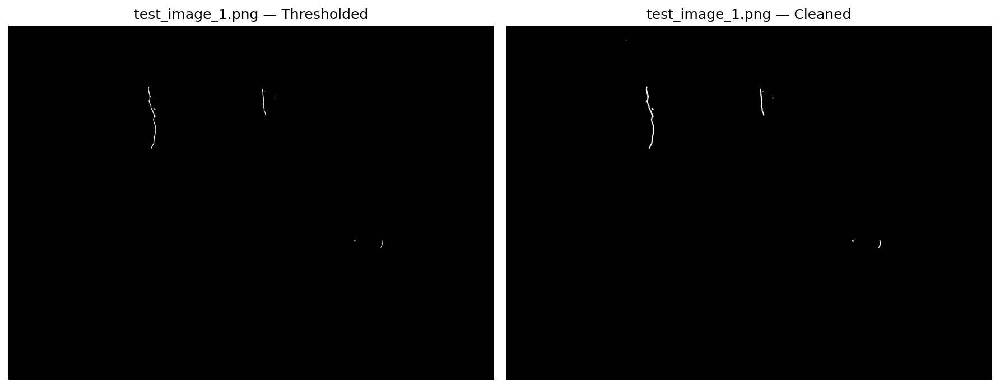

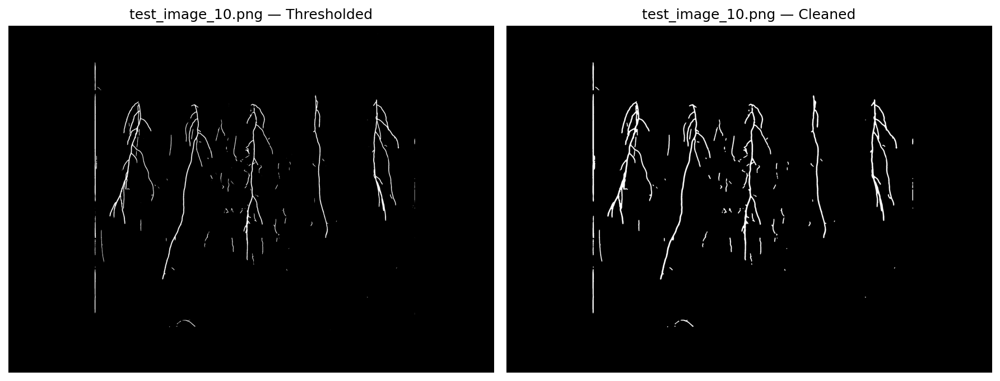

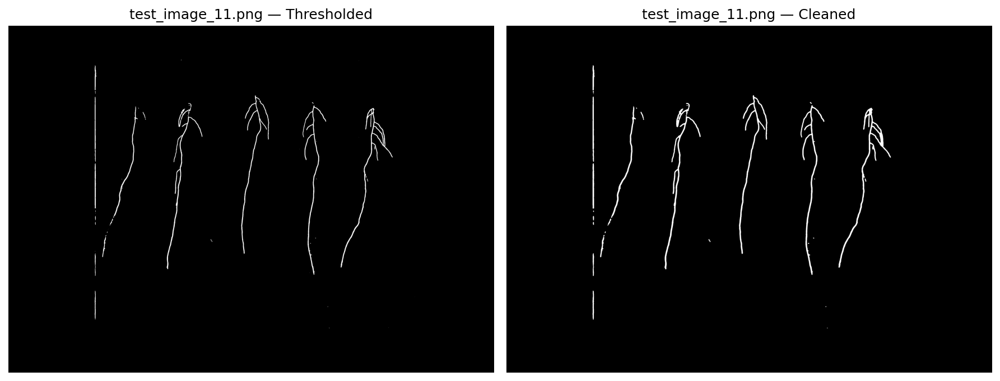

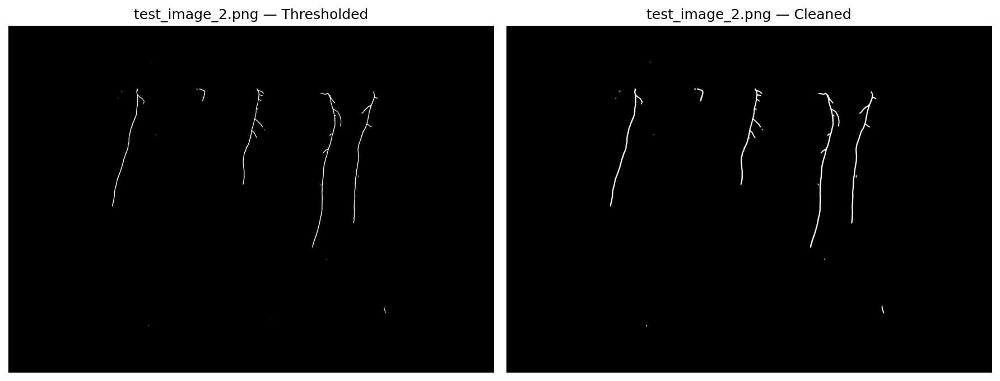

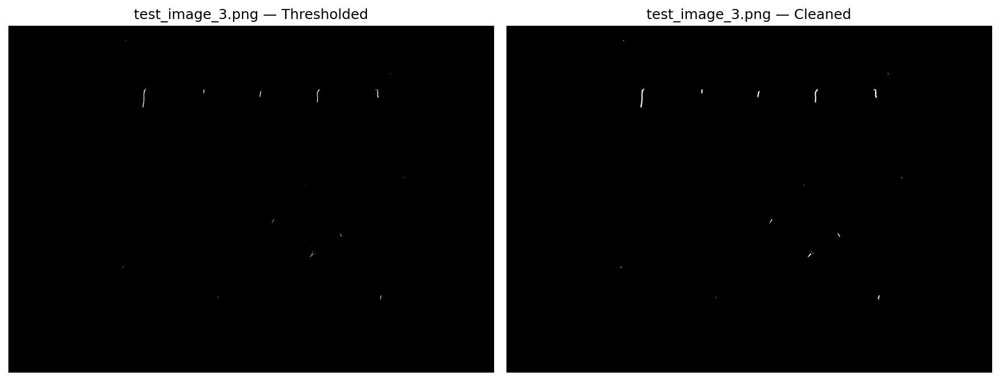

...

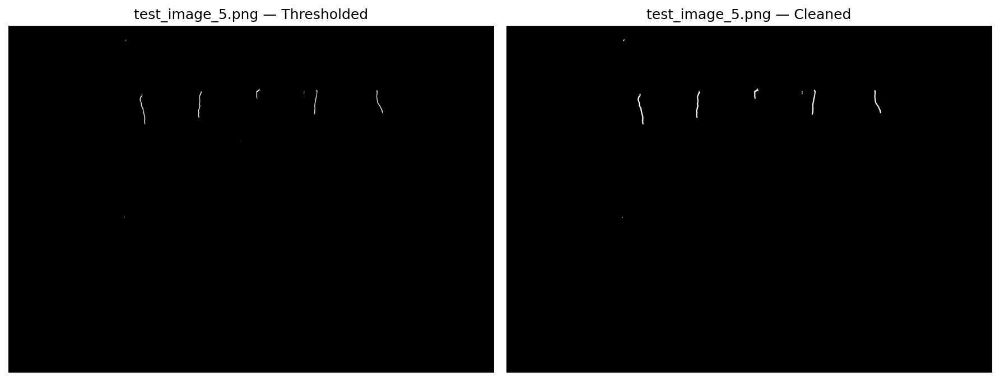

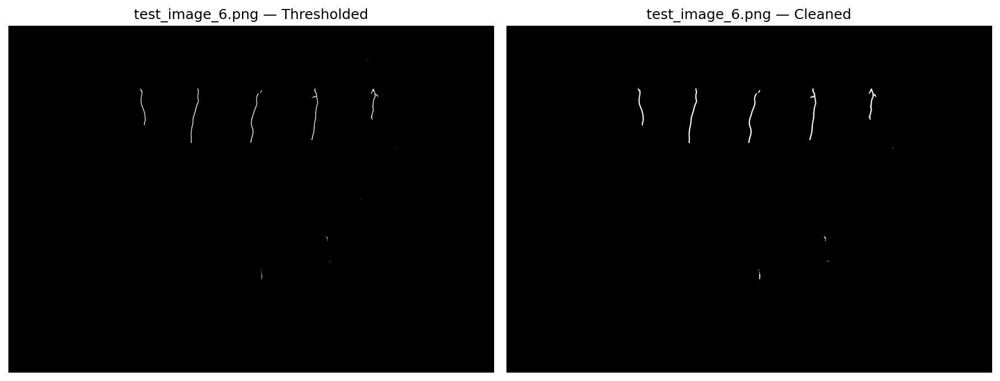

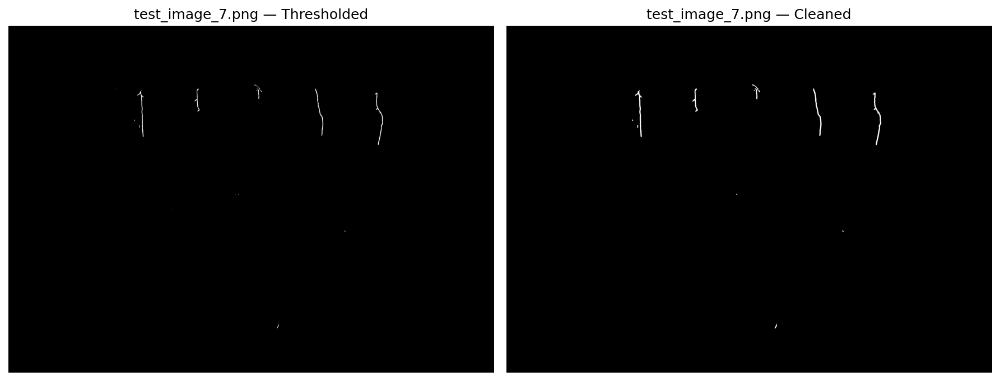

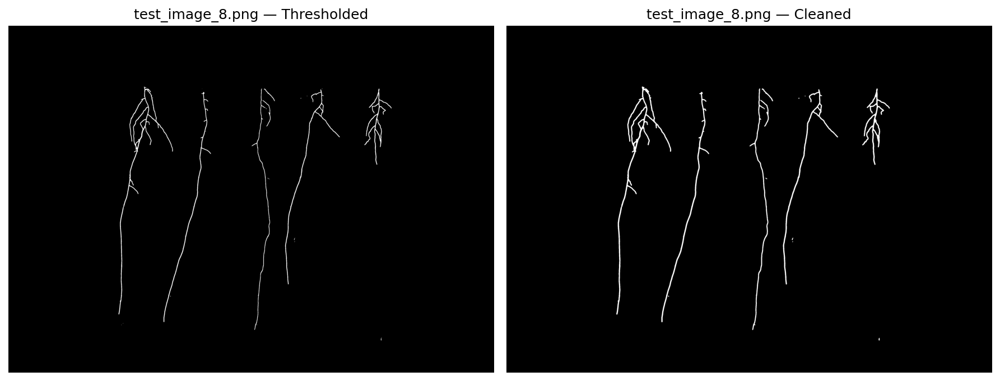

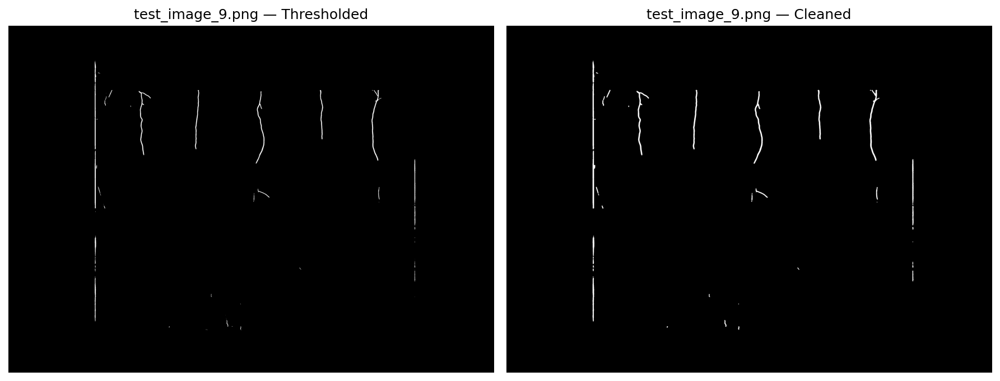

In [14]:
closed_masks = {}

kernel_size = (3, 3)
dilate_iterations = 5
erode_iterations = 3
kernel_shape = cv2.MORPH_ELLIPSE

kernel = cv2.getStructuringElement(kernel_shape, kernel_size)

for name, binary in thresholded_masks.items():
    mask = binary.copy()

    # Opening before closing to remove small noise (condensation)
    opened = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # Closing = dilation then erosion
    dilated = cv2.dilate(opened, kernel, iterations=dilate_iterations)
    closed = cv2.erode(dilated, kernel, iterations=erode_iterations)

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(closed)
    min_area = 100
    filtered = np.zeros_like(closed)
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            filtered[labels == i] = 1

    closed_masks[name] = filtered

    # Visualization
    plt.figure(figsize=(12, 5), dpi=150)
    plt.subplot(1, 2, 1)
    plt.imshow(mask * 255, cmap='gray')
    plt.title(f'{name} — Thresholded')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(closed * 255, cmap='gray')
    plt.title(f'{name} — Cleaned')
    plt.axis('off')
    plt.tight_layout()
    plt.show()


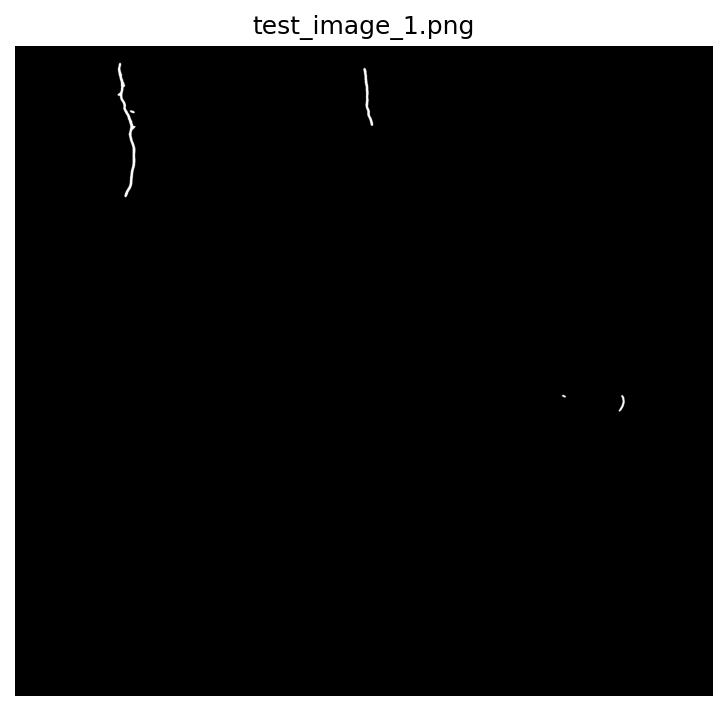

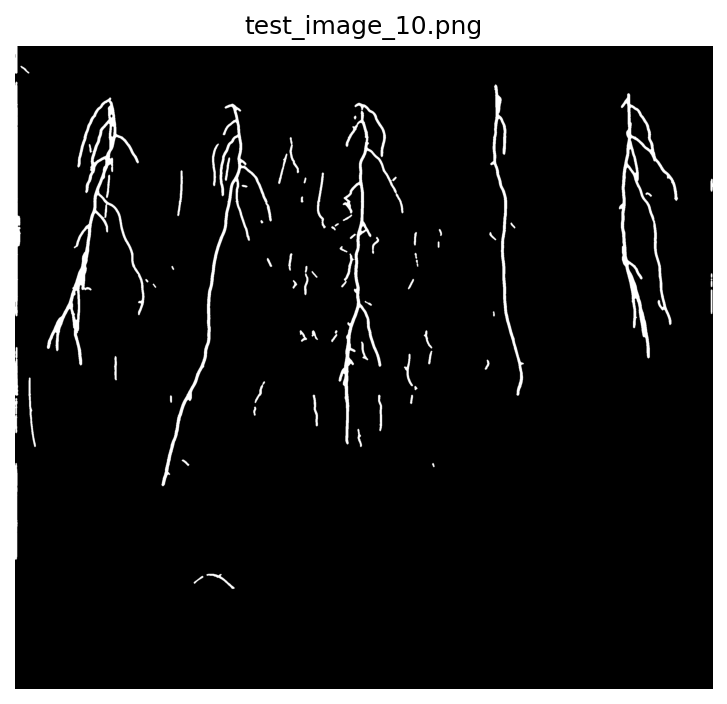

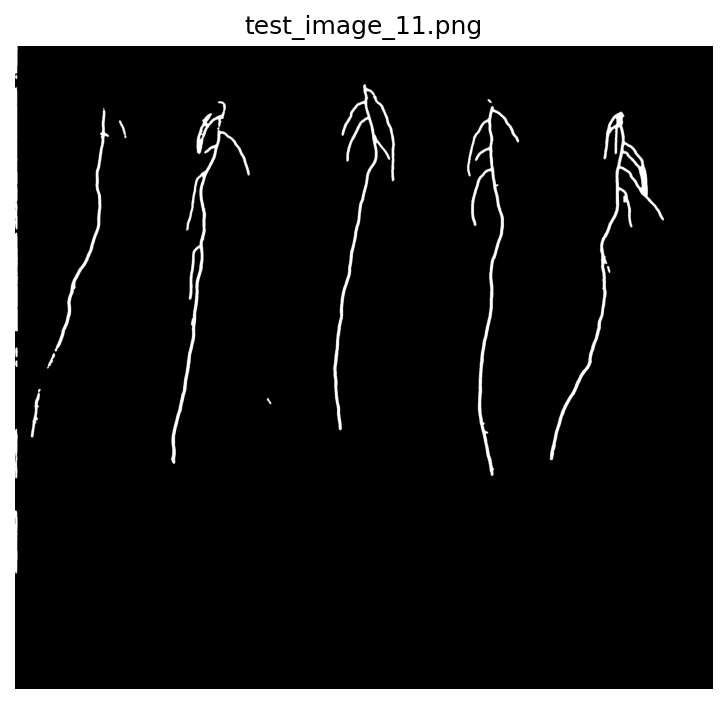

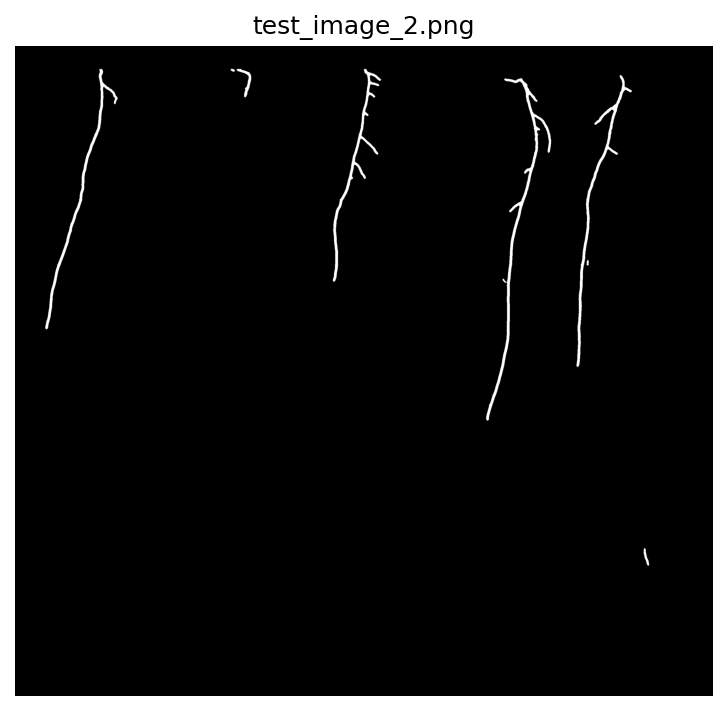

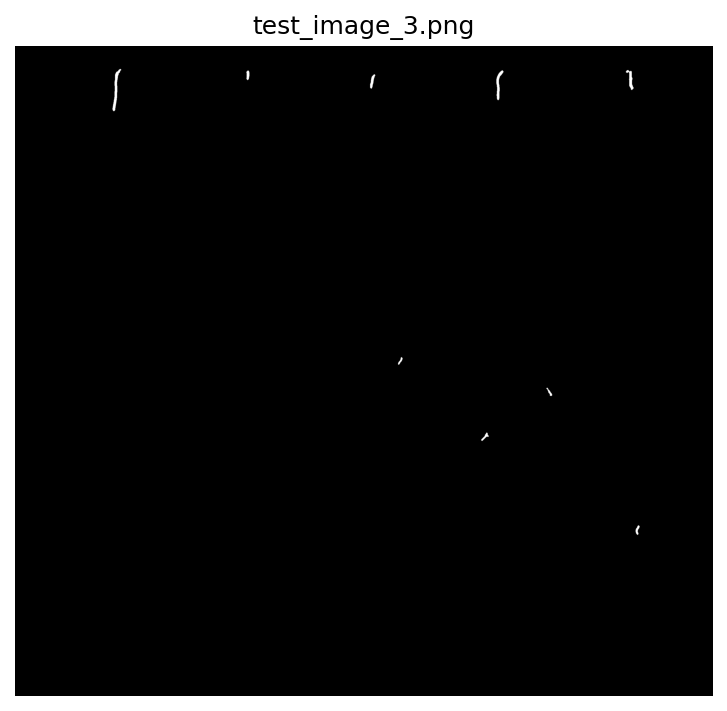

...

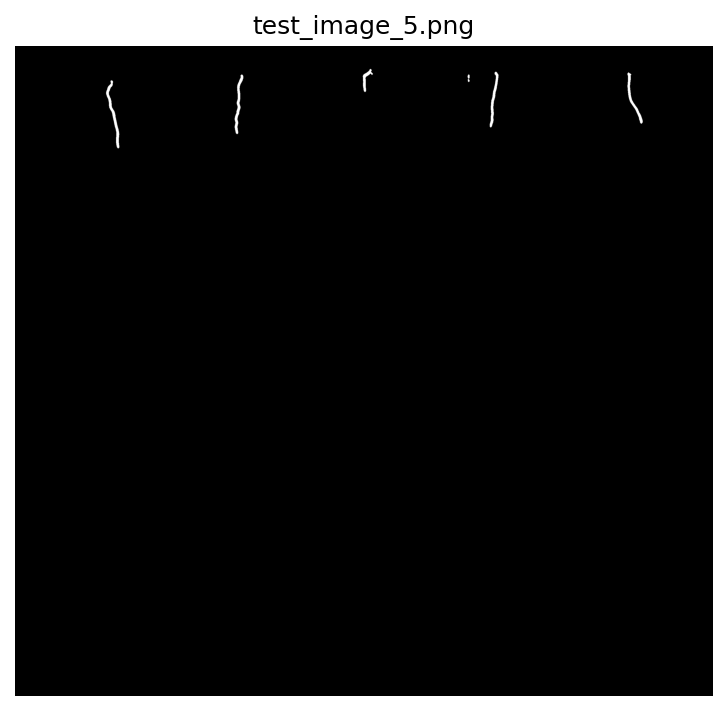

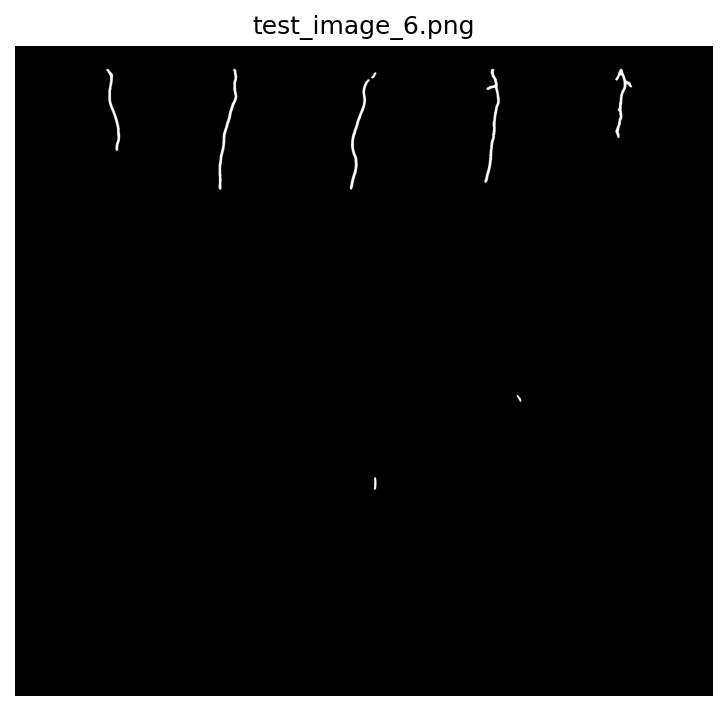

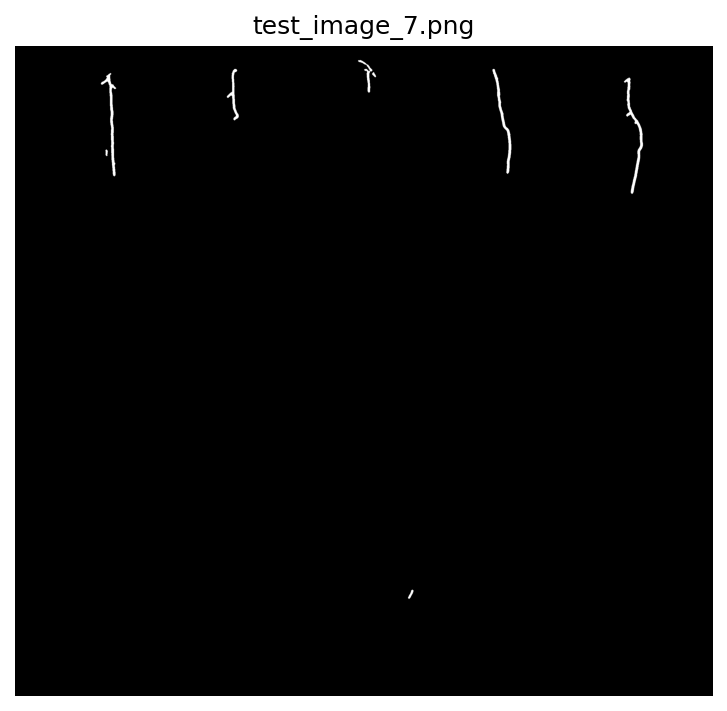

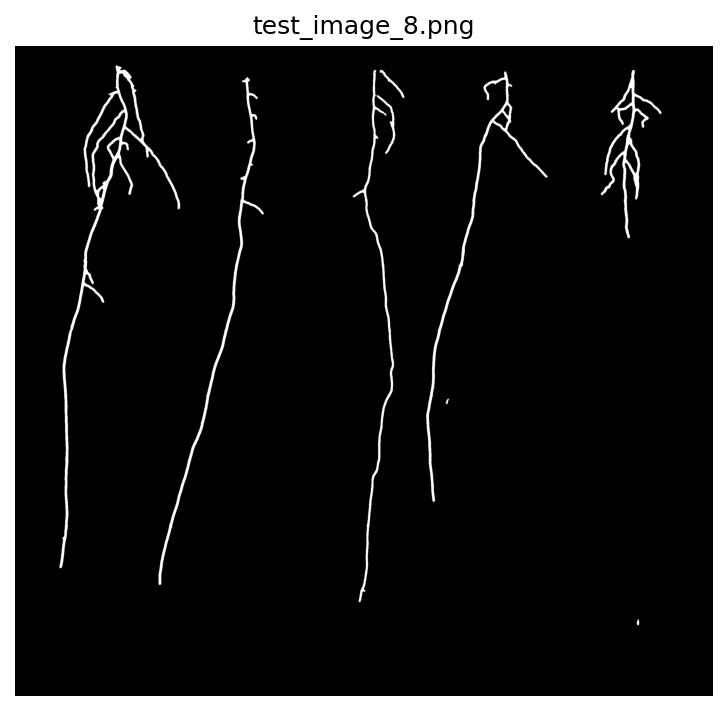

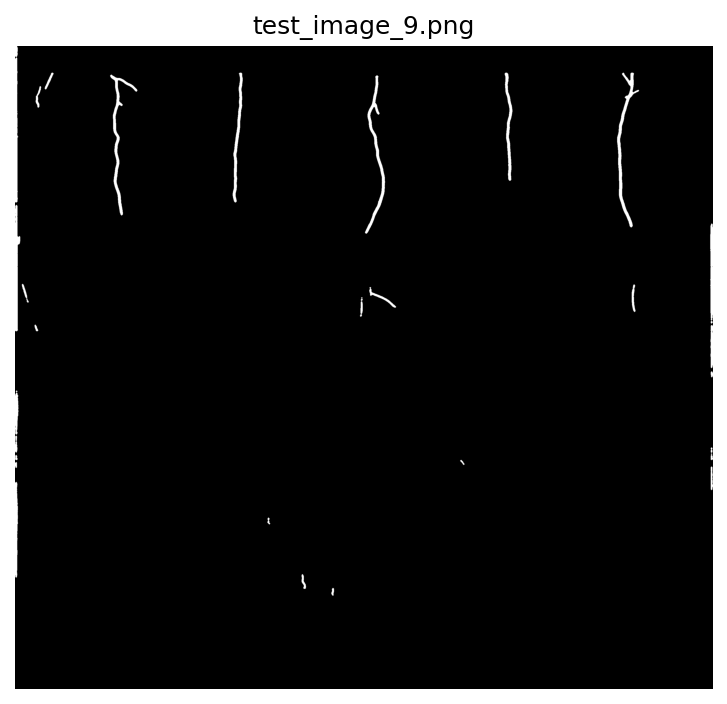

In [15]:
# Crop top + horizontally to petri dish bounds
dish_cropped_masks = {}
top_crop_ratio = 0.15  # Crop 15% from the top

for name, closed in closed_masks.items():
    # Get crop_info from earlier prediction step
    crop_info = raw_predictions[name]['crop_info']

    # Dish bounds
    x_start = crop_info['x_start']
    crop_size = crop_info['crop_size']
    x_end = min(x_start + crop_size, closed.shape[1])

    # Horizontal crop to match Petri dish width
    horizontally_cropped = closed[:, x_start:x_end]

    # Crop top x% to avoid noise above seed region
    h = horizontally_cropped.shape[0]
    top_crop = int(h * top_crop_ratio)
    final_cropped = horizontally_cropped[top_crop:, :]

    # Save result
    dish_cropped_masks[name] = final_cropped

    # Visualize result
    plt.figure(figsize=(6, 6), dpi=150)
    plt.imshow(final_cropped * 255, cmap='gray')
    plt.title(f'{name}')
    plt.axis('off')
    plt.show()

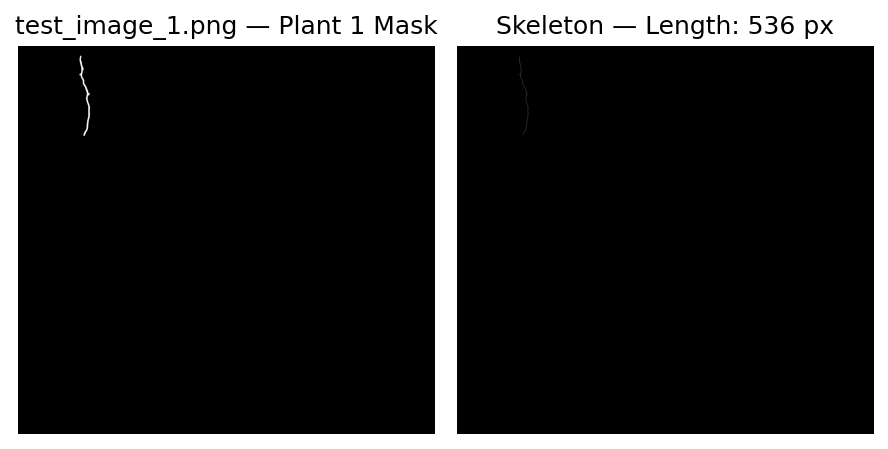

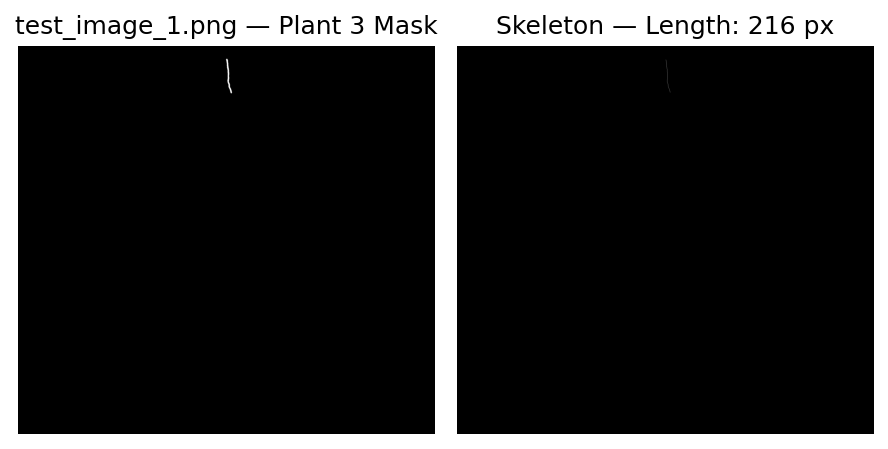

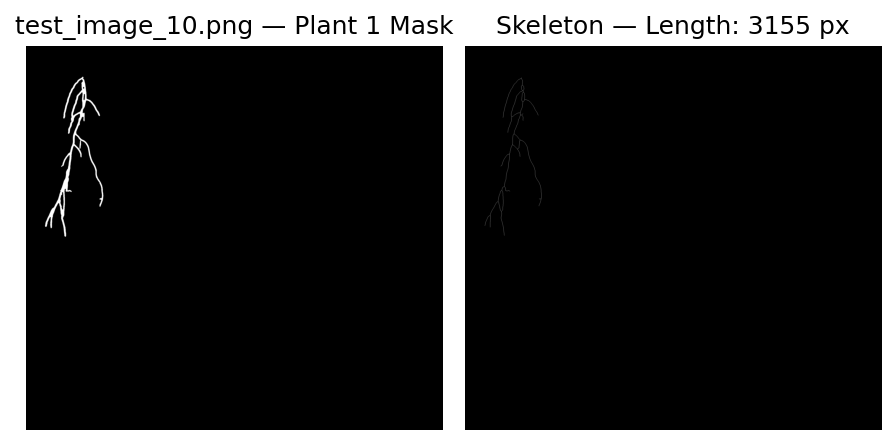

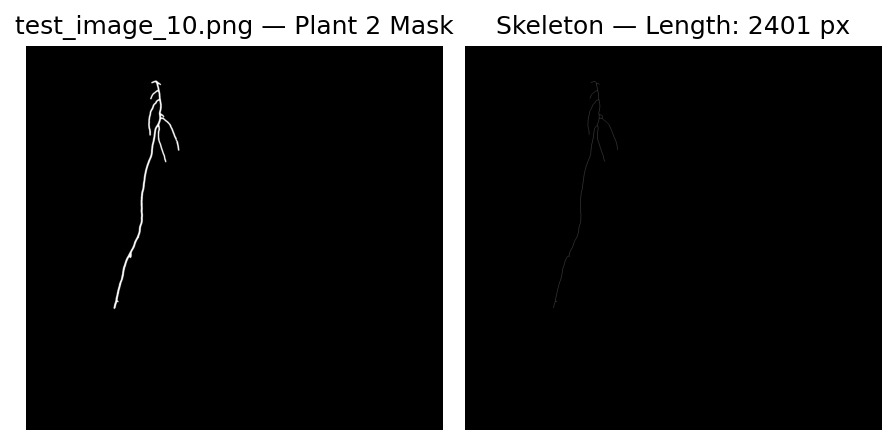

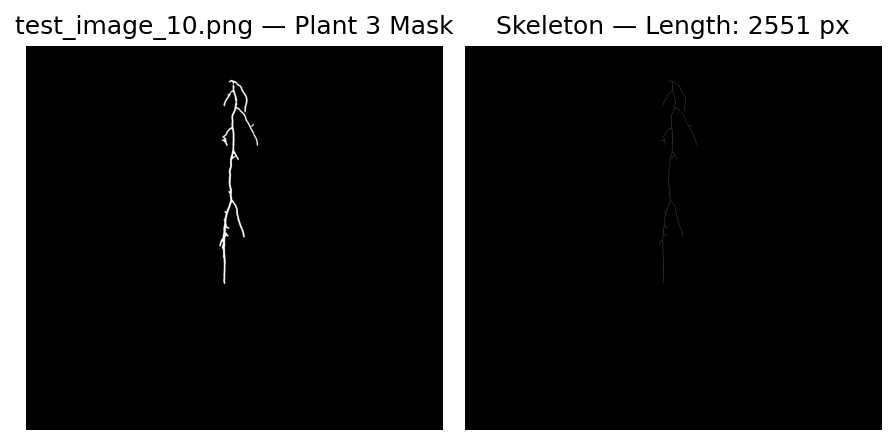

...

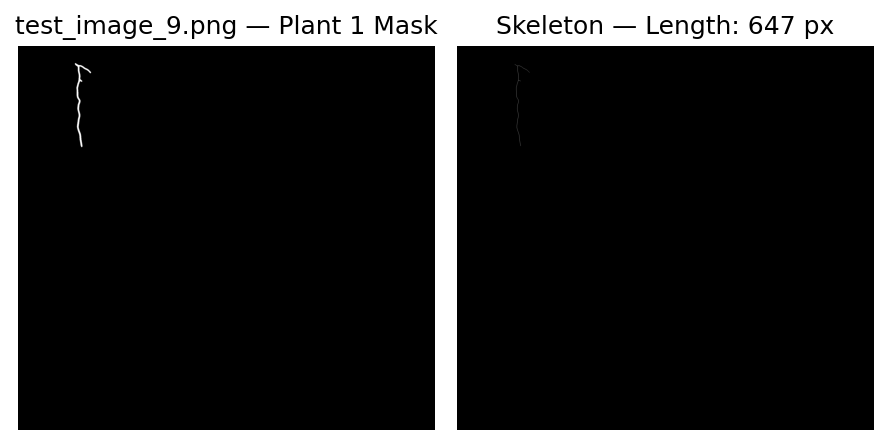

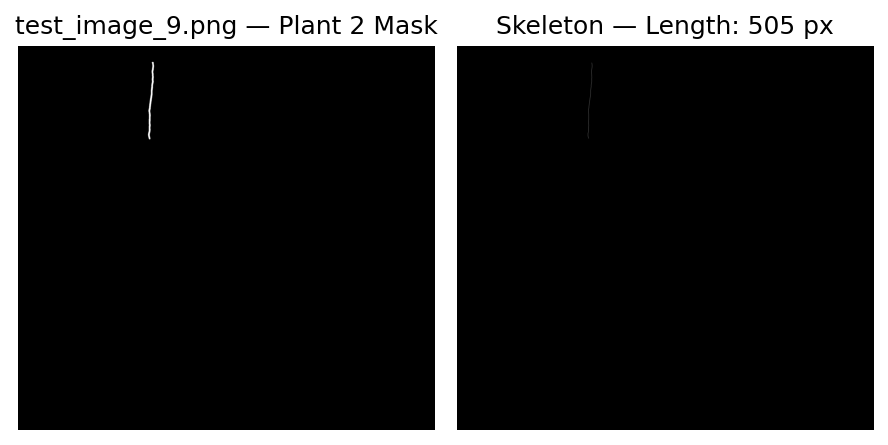

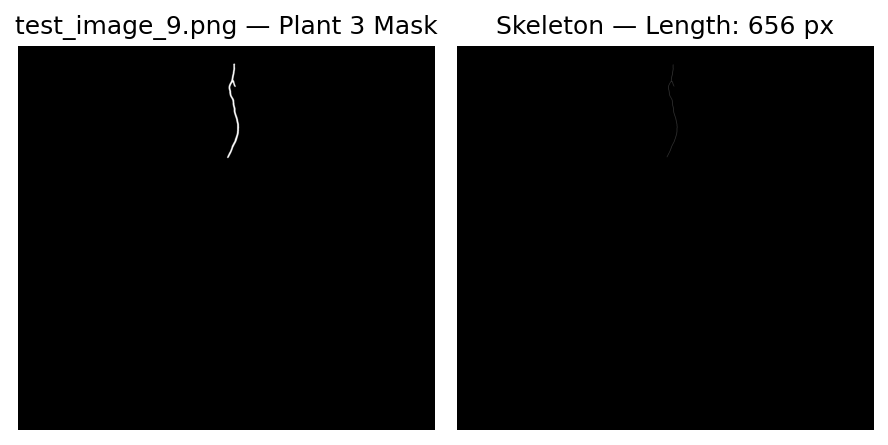

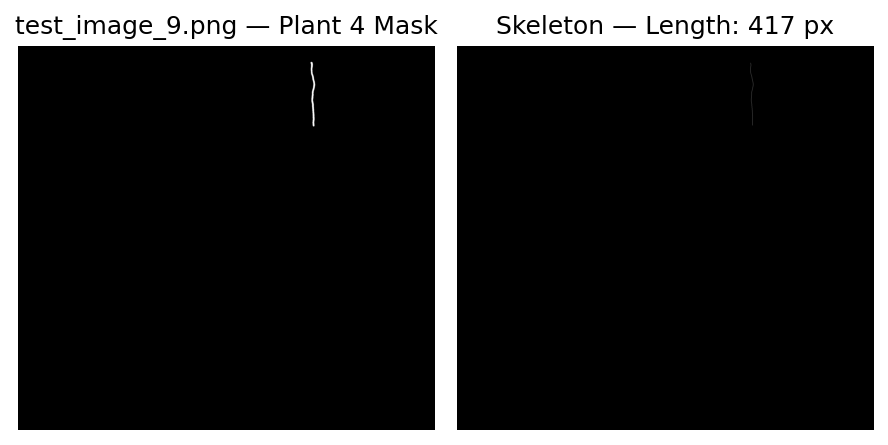

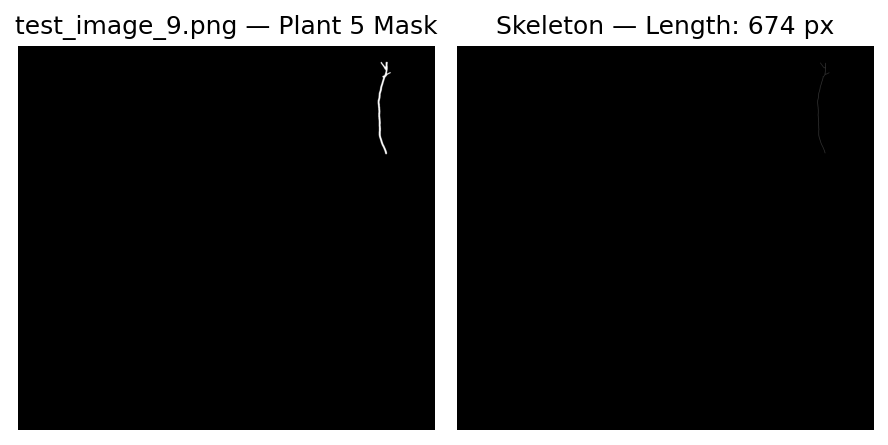

In [16]:
# Settings
num_plants = 5
min_area = 200
aspect_ratio_threshold = 1.5  # height must be at least 1.5x width
vertical_start_thresh_ratio = 0.3  # filter components that start too low

segmented_root_masks = {}

for img_name, mask in dish_cropped_masks.items():
    h, w = mask.shape
    band_width = w / num_plants

    # Connected components on the full mask (not per-band)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask)

    # One empty mask per plant
    plant_masks = [np.zeros_like(mask, dtype=np.uint8) for _ in range(num_plants)]

    for lab_id in range(1, num_labels):  # skip background
        x, y, cw, ch, area = stats[lab_id]
        cx = centroids[lab_id][0]

        if area < min_area:
            continue

        aspect_ratio = ch / cw if cw > 0 else 0
        if aspect_ratio < aspect_ratio_threshold:
            continue
        

        if y > int(h * vertical_start_thresh_ratio):
            continue

        # Assign to the closest band center
        band_centers = [ (k + 0.5) * band_width for k in range(num_plants) ]
        band_idx = int(np.argmin([abs(cx - c) for c in band_centers]))

        component_mask = (labels == lab_id).astype(np.uint8)

        # Keep the largest component per band
        if np.count_nonzero(plant_masks[band_idx]) < area:
            plant_masks[band_idx] = component_mask

    # store 0/255 masks per plant for this image
    segmented_root_masks[img_name] = [(m * 255).astype(np.uint8) for m in plant_masks]
    
    root_lengths = {}
for img_name, masks in segmented_root_masks.items():
    lengths = []
    for k, m in enumerate(masks, 1):
        if np.count_nonzero(m) == 0:
            lengths.append(0)
            continue

        binary = (m > 0).astype(np.uint8)
        skeleton = skeletonize(binary).astype(np.uint8)

        # quick length proxy (pixels) -- see upgrade #3 to improve
        length_px = int(np.count_nonzero(skeleton))
        lengths.append(length_px)

        # Optional visualization (unique figure per plant)
        plt.figure(figsize=(6, 3), dpi=150)
        plt.subplot(1, 2, 1); plt.imshow(binary*255, cmap='gray'); plt.title(f'{img_name} — Plant {k} Mask'); plt.axis('off')
        plt.subplot(1, 2, 2); plt.imshow(skeleton*255, cmap='gray'); plt.title(f'Skeleton — Length: {length_px} px'); plt.axis('off')
        plt.tight_layout(); plt.show()

    root_lengths[img_name] = lengths

In [17]:
# Folder to save final root masks
save_dir = "/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/06_task8_masks"
os.makedirs(save_dir, exist_ok=True)

# Dict to store them in memory for later processing
final_root_masks = {}

# Save and store
for name, plant_masks in segmented_root_masks.items():
    base_name = os.path.splitext(name)[0]  # e.g. 'test_image_1'

    for idx, mask in enumerate(plant_masks):
        plant_num = idx + 1
        key = f"{base_name}_plant_{plant_num}"
        filename = f"{key}.png"
        filepath = os.path.join(save_dir, filename)

        # Save the mask to file
        cv2.imwrite(filepath, mask)

        # Store in dict
        final_root_masks[key] = mask

        print(f"Saved and stored: {key}")

Saved and stored: test_image_1_plant_1
Saved and stored: test_image_1_plant_2
Saved and stored: test_image_1_plant_3
Saved and stored: test_image_1_plant_4
Saved and stored: test_image_1_plant_5
Saved and stored: test_image_10_plant_1
Saved and stored: test_image_10_plant_2
Saved and stored: test_image_10_plant_3
Saved and stored: test_image_10_plant_4
Saved and stored: test_image_10_plant_5
Saved and stored: test_image_11_plant_1
Saved and stored: test_image_11_plant_2
Saved and stored: test_image_11_plant_3
Saved and stored: test_image_11_plant_4
Saved and stored: test_image_11_plant_5
Saved and stored: test_image_2_plant_1
Saved and stored: test_image_2_plant_2
Saved and stored: test_image_2_plant_3
Saved and stored: test_image_2_plant_4
Saved and stored: test_image_2_plant_5
Saved and stored: test_image_3_plant_1
Saved and stored: test_image_3_plant_2
Saved and stored: test_image_3_plant_3
Saved and stored: test_image_3_plant_4
Saved and stored: test_image_3_plant_5
Saved and store

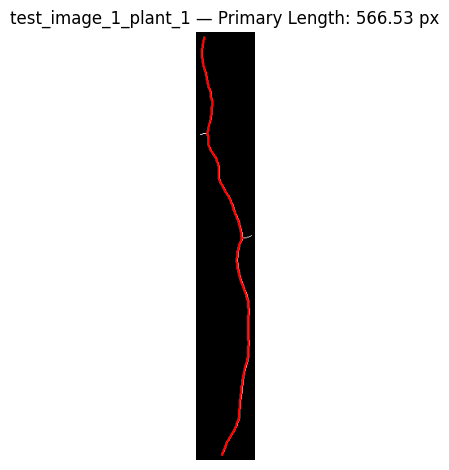

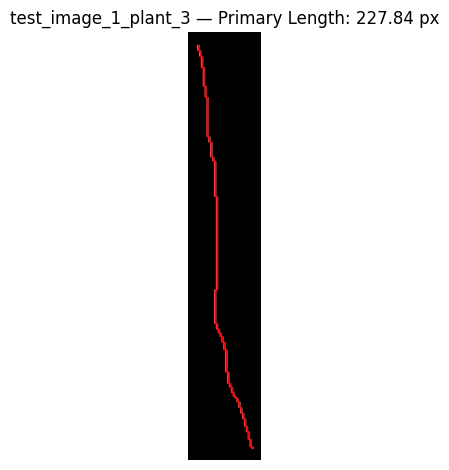

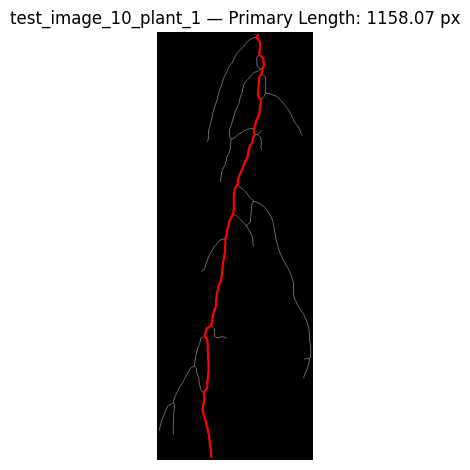

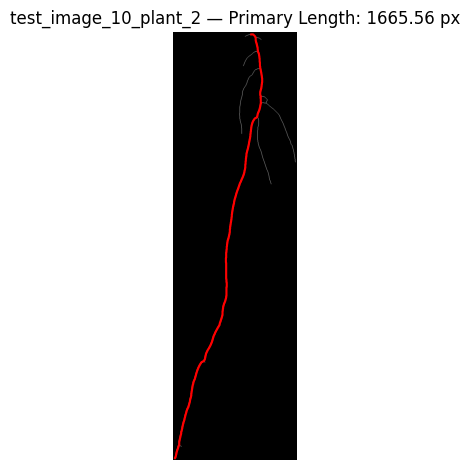

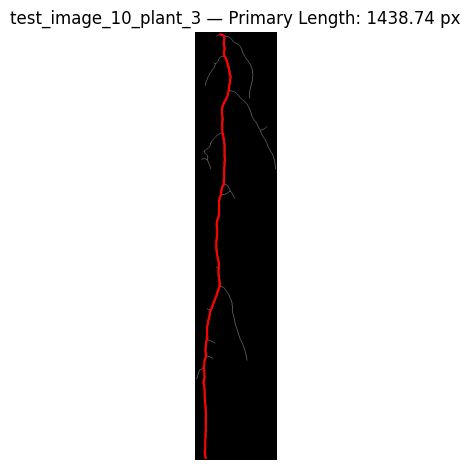

...

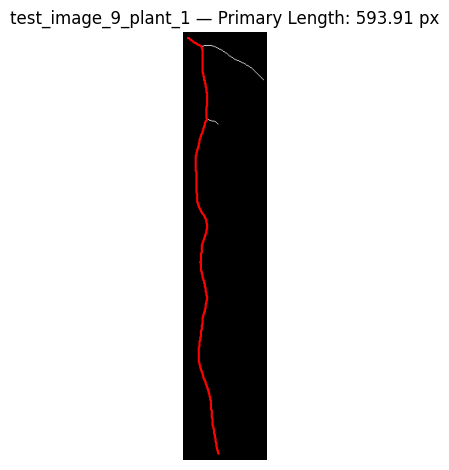

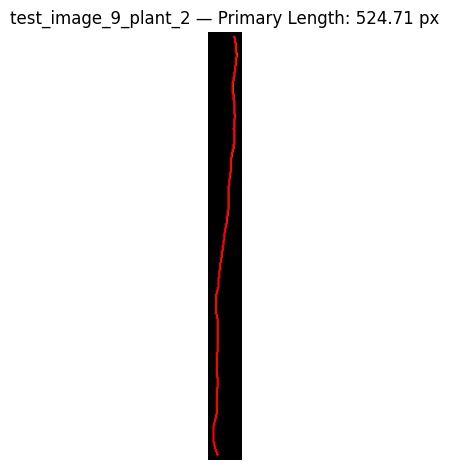

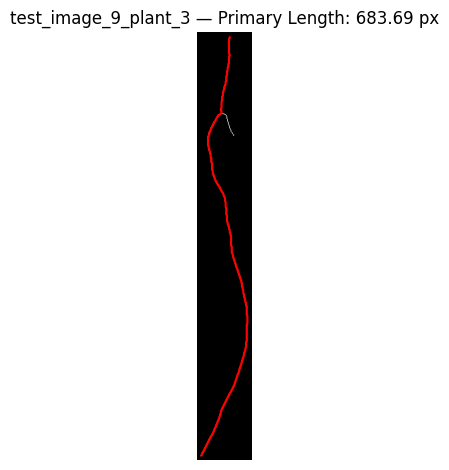

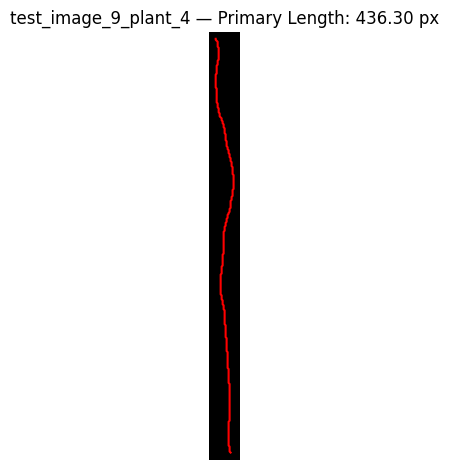

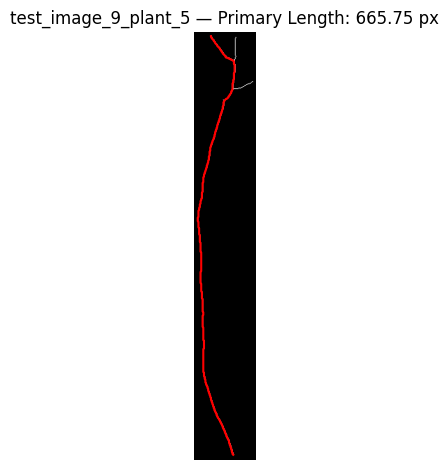

In [18]:
primary_root_lengths = {}

for key, mask in final_root_masks.items():
    # Binary mask
    binary_mask = (mask > 0).astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

    if num_labels <= 1:
        primary_root_lengths[key] = 0.00
        continue

    # Largest component assumed to be the primary root
    largest_component = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
    component_mask = (labels == largest_component).astype(np.uint8)

    # Crop around bounding box
    x, y, w, h, _ = stats[largest_component]
    cropped_component = component_mask[y:y+h, x:x+w]

    # Skeletonize the cropped root
    skeleton = skeletonize(cropped_component)

    # Build graph from skeleton pixels using Euclidean weights
    G = nx.Graph()
    skel_coords = np.argwhere(skeleton)
    coord_set = set(map(tuple, skel_coords))

    for y0, x0 in skel_coords:
        for dy, dx in [(-1, 0), (1, 0), (0, -1), (0, 1),
                       (-1, -1), (-1, 1), (1, -1), (1, 1)]:
            neighbor = (y0 + dy, x0 + dx)
            if neighbor in coord_set:
                weight = np.hypot(dy, dx)
                G.add_edge((y0, x0), neighbor, weight=weight)

    if G.number_of_nodes() == 0:
        primary_root_lengths[key] = 0.00
        continue

    # Find topmost and bottommost nodes
    top_node = min(G.nodes, key=lambda n: n[0])
    bottom_node = max(G.nodes, key=lambda n: n[0])

    try:
        path = nx.dijkstra_path(G, source=top_node, target=bottom_node, weight='weight')
        path_length = nx.dijkstra_path_length(G, source=top_node, target=bottom_node, weight='weight')
    except nx.NetworkXNoPath:
        path = []
        path_length = 0.0

    primary_root_lengths[key] = round(path_length, 2)

    # Visualization
    fig, ax = plt.subplots()
    ax.imshow(skeleton, cmap='gray')
    if path:
        path_y, path_x = zip(*path)
        ax.plot(path_x, path_y, color='red', linewidth=1.5)
    else:
        ax.text(0.5, 0.5, "No valid path", transform=ax.transAxes, ha='center', va='center', color='red')
    ax.set_title(f"{key} — Primary Length: {primary_root_lengths[key]:.2f} px")
    ax.axis('off')
    plt.tight_layout()
    plt.show()

In [19]:
# Path to original RGB images
original_images_dir = "/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/Kaggle"
top_crop_ratio = 0.15

for key, mask in final_root_masks.items():
    image_base = "_".join(key.split("_")[:-2]) + ".tif"

    # Load and crop original RGB image (Task 7 style)
    image_path = os.path.join(original_images_dir, image_base)
    rgb = cv2.imread(image_path)
    if rgb is None:
        continue
    rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)

    crop_info = raw_predictions[image_base]["crop_info"]
    x_start = crop_info["x_start"]
    crop_size = crop_info["crop_size"]
    x_end = min(x_start + crop_size, rgb.shape[1])

    rgb_cropped = rgb[:, x_start:x_end]
    top_crop = int(rgb_cropped.shape[0] * top_crop_ratio)
    rgb_final = rgb_cropped[top_crop:, :]

    # Convert to grayscale RGB
    gray = cv2.cvtColor(rgb_final, cv2.COLOR_RGB2GRAY)
    gray_rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
    overlay = gray_rgb.copy()

    # Process mask
    binary_mask = (mask > 0).astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)
    if num_labels <= 1:
        continue

    largest_component = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
    component_mask = (labels == largest_component).astype(np.uint8)

    # Skeleton and graph
    skeleton = skeletonize(component_mask)
    coords = np.argwhere(skeleton)
    coord_set = set(map(tuple, coords))

    G = nx.Graph()
    for y0, x0 in coords:
        for dy, dx in [(-1, 0), (1, 0), (0, -1), (0, 1),
                       (-1, -1), (-1, 1), (1, -1), (1, 1)]:
            neighbor = (y0 + dy, x0 + dx)
            if neighbor in coord_set:
                G.add_edge((y0, x0), neighbor, weight=np.hypot(dy, dx))

    if G.number_of_nodes() == 0:
        continue

    try:
        top_node = min(G.nodes, key=lambda n: n[0])
        bottom_node = max(G.nodes, key=lambda n: n[0])
        path = nx.dijkstra_path(G, source=top_node, target=bottom_node, weight='weight')
    except nx.NetworkXNoPath:
        continue

    # Draw red path on grayscale image
    path_coords = []
    for (y_, x_) in path:
        if 0 <= y_ < overlay.shape[0] and 0 <= x_ < overlay.shape[1]:
            overlay[y_, x_] = [255, 0, 0]  # single red pixel
            path_coords.append((y_, x_))

    if not path_coords:
        continue

    # Crop to bounding box of path
    path_coords = np.array(path_coords)
    y_min, x_min = path_coords.min(axis=0)
    y_max, x_max = path_coords.max(axis=0)

    margin = 25
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, overlay.shape[0])
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, overlay.shape[1])

    cropped_overlay = overlay[y_min:y_max, x_min:x_max]

    # Show final result
    plt.figure(figsize=(4, 4), dpi=150)
    plt.imshow(cropped_overlay)
    plt.title(f"{key}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

[ WARN:0@67959.500] global loadsave.cpp:268 findDecoder imread_('/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/Kaggle/test_image_1.tif'): can't open/read file: check file path/integrity
[ WARN:0@67959.500] global loadsave.cpp:268 findDecoder imread_('/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/Kaggle/test_image_1.tif'): can't open/read file: check file path/integrity
[ WARN:0@67959.500] global loadsave.cpp:268 findDecoder imread_('/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/Kaggle/test_image_1.tif'): can't open/read file: check file path/integrity
[ WARN:0@67959.500] global loadsave.cpp:268 findDecoder imread_('/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/Kaggle/test_image_1.tif'): can't open/read file

In [20]:
import csv
# Path to save the CSV
csv_path = "/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/06_submission.csv"

# Write to CSV
with open(csv_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])  # header
    for plant_id, length in primary_root_lengths.items():
        writer.writerow([plant_id, length])

print(f"Saved primary root lengths to:\n{csv_path}")

Saved primary root lengths to:
/Volumes/T7/Artificial Intelligence/YEAR 2.1/Block B/2024-25b-fai2-adsai-RayaNedaBorisova220471/Block B retake/task8/06_submission.csv
